In [1]:
from google.colab import drive
drive.mount('/content/drive')
# folder path
path='/content/drive/My Drive/ECSE 415/Assignment_1/images/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# read images and convert from BGR to gray
lighthouse = cv2.imread(path+'lighthouse.png') # BGR
lighthouse = cv2.cvtColor(lighthouse, cv2.COLOR_RGB2GRAY)
gauss_lighthouse = cv2.imread(path+'gaussian_lighthouse.png') # BGR
gauss_lighthouse = cv2.cvtColor(gauss_lighthouse, cv2.COLOR_RGB2GRAY)

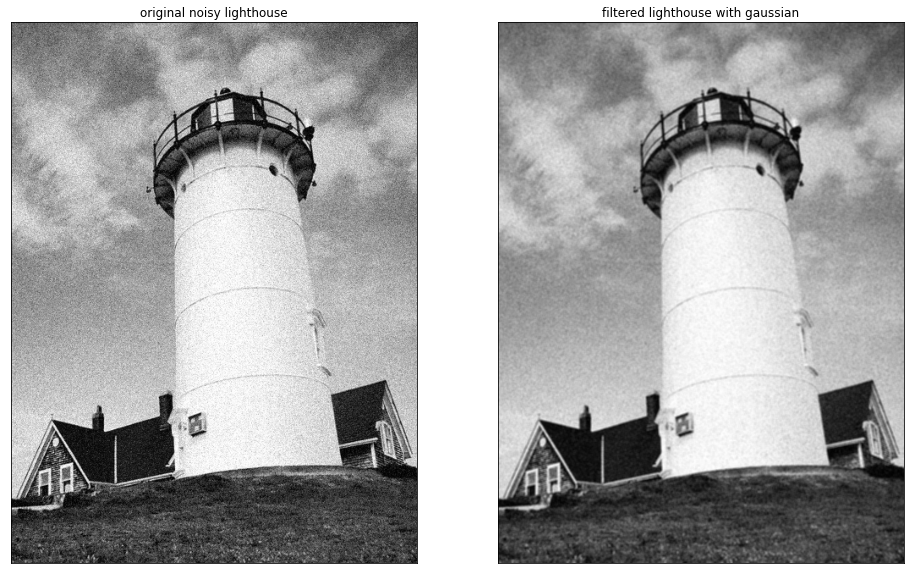

In [3]:
# Code taken from Tutorial 2
# 3x3 array for Gaussain Smoothing, sigma = 2, padding = constant
filtered_gauss_original = cv2.GaussianBlur(gauss_lighthouse, (3,3), 2,cv2.BORDER_CONSTANT)

plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gauss_lighthouse, cmap='gray') # 2x2 subplot, 1 selected
plt.title("original noisy lighthouse"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_gauss_original, cmap='gray') # 2x2 subplot, 2 selected
plt.title("filtered lighthouse with gaussian"), plt.xticks([]), plt.yticks([])
plt.show()

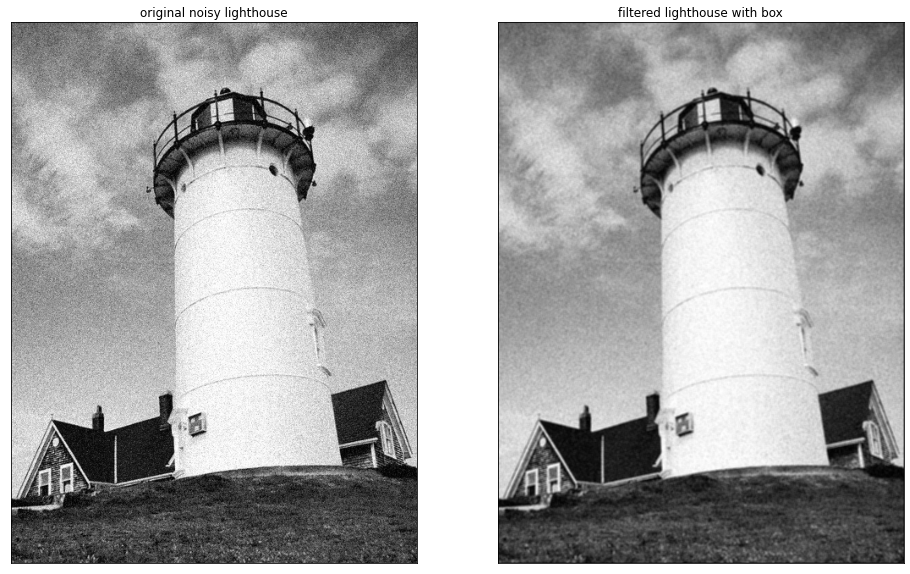

In [4]:
# code inspired from Tutorial 2, modified to fit box filter
def box_filter(input_image, kernel_size):
    # calculate pad_size
    # in case of 3x3 kernel_size, we want to pad each side with 1 new pixel

    pad_size = np.floor(kernel_size/2).astype("uint8")

    # pad image. Here we are using constant padding with constant=0, basically zero_padding
    pad_input_image = np.pad(input_image, pad_width=int(pad_size), mode='constant', constant_values=0)

    # Get Height and Width of the original image.
    h, w = pad_input_image.shape 

    # initialize output image to be similar to original image size
    output_image = np.zeros_like(input_image)

    # Now Traverse through image using two for loops
    for i in range(0, h - 2*pad_size): # pad_size is applied on both side, thus the 2*
        for j in range(0, w - 2*pad_size): 
            # box filter takes average of all the values within box boundary
            output_image[i,j] = np.sum(pad_input_image[i:i+kernel_size, j:j+kernel_size])/(kernel_size**2)

    # return output
    return output_image

# define filter size
filter_size = 3
filtered_box_original = box_filter(gauss_lighthouse, filter_size)

# plot images
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gauss_lighthouse, cmap='gray') # 2x2 subplot, 1 selected
plt.title("original noisy lighthouse"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_box_original, cmap='gray') # 2x2 subplot, 2 selected
plt.title("filtered lighthouse with box"), plt.xticks([]), plt.yticks([])
plt.show()

In [5]:
from skimage import metrics

# code taken from skimage library to compute PNSR value
pnsr_gauss = metrics.peak_signal_noise_ratio(lighthouse, filtered_gauss_original)
pnsr_box =  metrics.peak_signal_noise_ratio(lighthouse, filtered_box_original)
print('PNSR for Gaussian: ' + str(pnsr_gauss))
print('PNSR for Box: ' + str(pnsr_box))

PNSR for Gaussian: 27.82501337928075
PNSR for Box: 27.08876741599937


The Peak-Signal-to-Noise-Ratio (PSNR) of both of the denoised images to that of the clean image differ by approximately 0.83. Since the PSNR value for Gaussian filter is higher than the box filter, the Gaussian filter gives superior results.

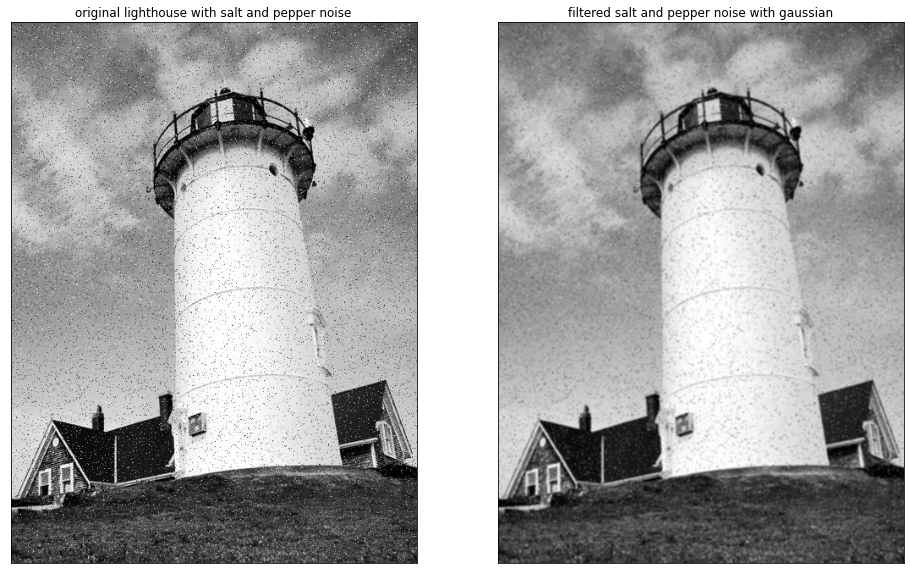

In [6]:
saltPepper_lighthouse = cv2.imread(path+'saltandpepper_lighthouse.png') # BGR
saltPepper_lighthouse = cv2.cvtColor(saltPepper_lighthouse, cv2.COLOR_RGB2GRAY)

# Code taken from Tutorial 2
# 3x3 array for Gaussain Smoothing, sigma = 2
filtered_gauss_saltPepper = cv2.GaussianBlur(saltPepper_lighthouse, (3,3), 2, cv2.BORDER_CONSTANT)

# plot images
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(saltPepper_lighthouse, cmap='gray') # 2x2 subplot, 1 selected
plt.title("original lighthouse with salt and pepper noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_gauss_saltPepper, cmap='gray') # 2x2 subplot, 2 selected
plt.title("filtered salt and pepper noise with gaussian"), plt.xticks([]), plt.yticks([])
plt.show()

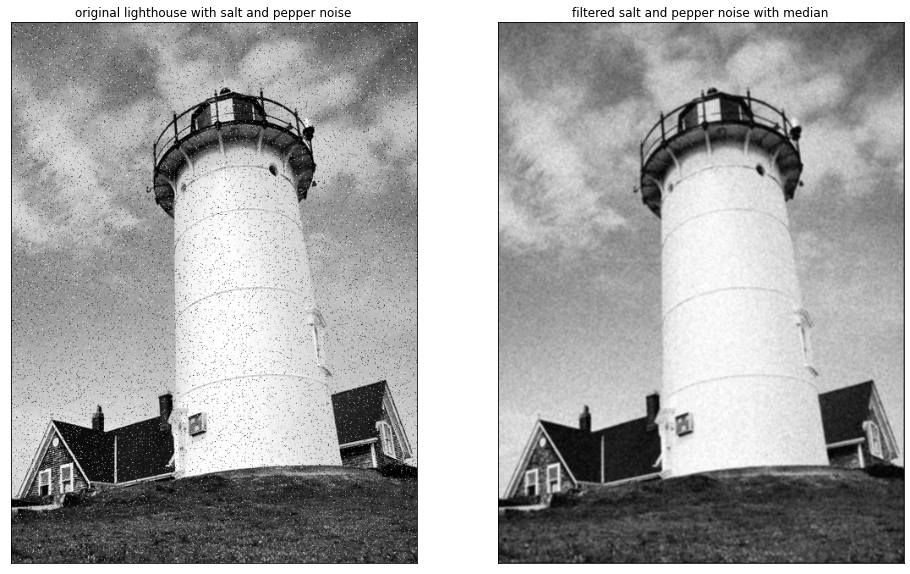

In [7]:
# Code taken from tutorial 2
def median_filter(input_image, kernel_size):
    # calculate pad_size
    # in case of 3x3 kernel_size, we want to pad each side with 1 new pixel

    pad_size = np.floor(kernel_size/2).astype("uint8")

    # pad image. Here we are using constant padding with constant=0, basically zero_padding
    pad_input_image = np.pad(input_image, pad_width=int(pad_size), mode='constant', constant_values=0)

    # Get Height and Width of the original image.
    h, w = pad_input_image.shape

    # initialize output image to be similar to original image size
    output_image = np.zeros_like(input_image)

    # Now Traverse through image using two for loops
    for i in range(0, h - 2*pad_size): 
        for j in range(0, w - 2*pad_size): 
            output_image[i,j] = np.median(pad_input_image[i:i+kernel_size, j:j+kernel_size])

    # return output
    return output_image

filter_size = 3
filtered_median_saltPepper = median_filter(saltPepper_lighthouse, filter_size)

# plot images
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(saltPepper_lighthouse, cmap='gray') # 2x2 subplot, 1 selected
plt.title("original lighthouse with salt and pepper noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_box_original, cmap='gray') # 2x2 subplot, 2 selected
plt.title("filtered salt and pepper noise with median"), plt.xticks([]), plt.yticks([])
plt.show()

In [8]:
from skimage import metrics

# code taken from skimage library to compute PNSR value
pnsr_gauss_saltPepper = metrics.peak_signal_noise_ratio(lighthouse, filtered_gauss_saltPepper)
pnsr_median_saltPepper =  metrics.peak_signal_noise_ratio(lighthouse, filtered_median_saltPepper)
print('PNSR for Gaussian: ' + str(pnsr_gauss_saltPepper))
print('PNSR for median: ' + str(pnsr_median_saltPepper))

PNSR for Gaussian: 26.683340176819243
PNSR for median: 30.251949638474898


The Peak-Signal-to-Noise-Ratio (PSNR) of both of the denoised images to that of the clean image differ by approximately 3.42. Since the PSNR value for medianfilter is a lot higher than the Gaussian filter, the median filter gives superior results.


2 Canny Edge Detection:

1. The 4 main steps for Canny edge detection are: 

*   Apply Gaussian filter to the image to blur the image
*   Apply Sobel filter to find the gradient of the image, then find the   magnitude and the orientations of the gradients
*   Apply Non-maximum suppression to thin down the edges found in the image by keeping only the maximum pixel value within the 8 gradient directions
*   Apply hysteresis thresholding by defining a low and a high threshold. The final canny edged image is obtained by filling the gap in high threshold image by the low threshold image







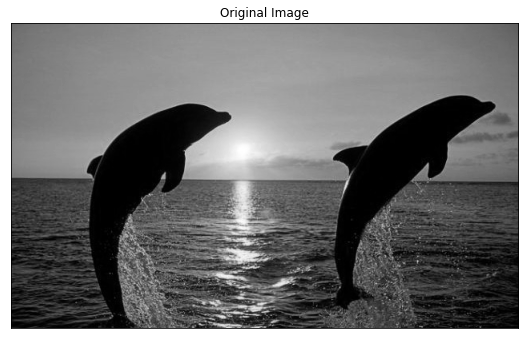

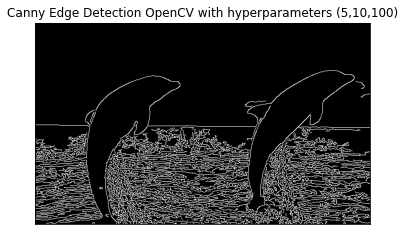

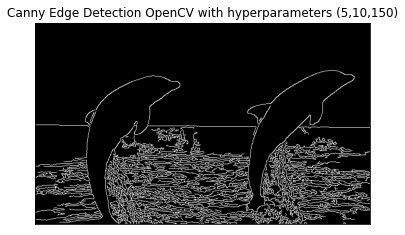

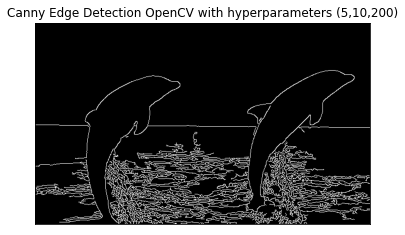

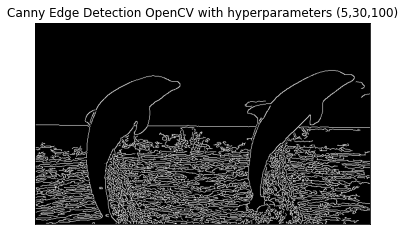

...

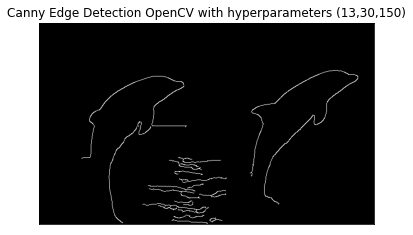

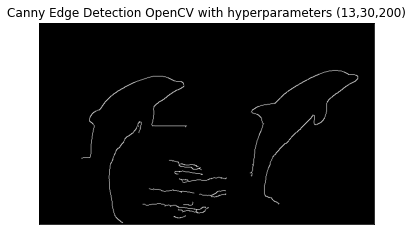

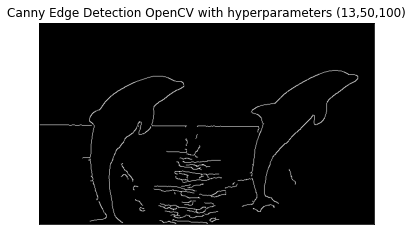

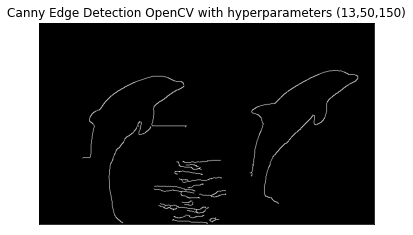

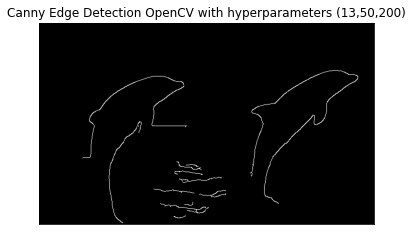

In [9]:
# Code taken from Tutorial 3
import matplotlib.pyplot as plt
import cv2
import numpy as np

dolphin = cv2.imread(path+'dolphin.jpg') # BGR
dolphin = cv2.cvtColor(dolphin, cv2.COLOR_RGB2GRAY)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(dolphin, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])

# define hyperparameters, (K,L,U)
K = [5,9,13]
L = [10,30,50]
U= [100, 150, 200]

for k in K:
  for l in L:
    for u in U:
      # sigma auto calculated for gaussian blur using cv2, sigma = 0
      dolphin_gauss = cv2.GaussianBlur(dolphin, (k, k), 0, cv2.BORDER_CONSTANT)
      # compute edges
      dolphin_edge_cv = cv2.Canny(dolphin_gauss, l, u)
      # plot images
      plt.figure(figsize=(6,6))
      plt.subplot(), plt.imshow(dolphin_edge_cv, cmap="gray")
      plt.title("Canny Edge Detection OpenCV with hyperparameters (" + str(k) +","
                + str(l) + "," + str(u) + ")"), plt.xticks([]), plt.yticks([])
      plt.show()

From the above experitment, it can be seen that by increasing the hyper-parameter K (Gaussian kernel size), the overall edge detection results into a less complex edge pattern. In other words, only the smoother edges are shown by increasing k and the noises (ripples in water) are discarded. This makes sense since larger k value causes more blurring of the image, thus high detailed edges will not be identified.

Similar effect can be seen by increasing the hyper-parameter H (the high threshold). The overall edge detection results into a less complex edge pattern since only the strongest edges would be kept. 

No significant effect can be seen by increasing the hyper-parameter L (the low threshold). The overall edge detection results look very similar for all three values of L. However, the edges pattern are slightly more complex for smaller values of L. The lower the value of L, the more noises and details the resulted edges can be detected.

There is a  relationship between the hyper-parameter K and H, as they both acheive a similar effect. The higher the value of K or H, the less complex will the edge pattern result. The noisy and detailed edges will be discarded. Whereas for the hyper-parameter L, very little effects can be observed.

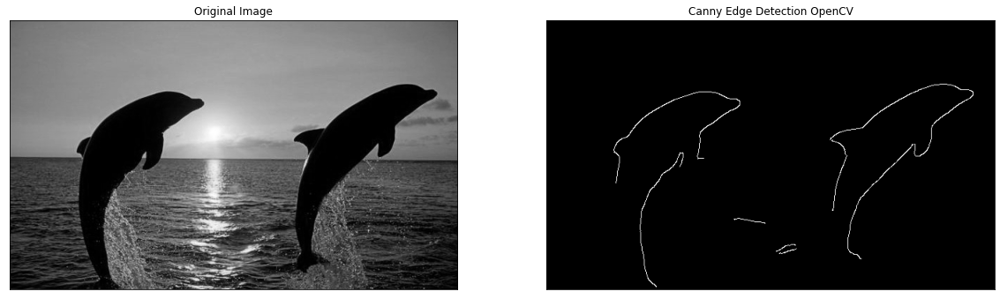

In [10]:
# optimal parameters
k = 15
l = 90
u = 190

# Code taken from Tutorial 3 & OpenCV library
dolphin_gauss = cv2.GaussianBlur(dolphin, (k, k), 0, cv2.BORDER_CONSTANT)
dolphin_edge_cv = cv2.Canny(dolphin_gauss, l, u)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(dolphin, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(dolphin_edge_cv, cmap="gray")
plt.title("Canny Edge Detection OpenCV"), plt.xticks([]), plt.yticks([])
plt.show()

3. Harris Corner Detector

In [11]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt


def Harris(image, k):
  # Code taken from Tutorial 3
  # load the image as grayscale
  img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  # 3x3 array for Gaussain Smoothing, sigma = 1,  0 padding 
  # Gaussian blur the image (optional)
  img_guass = cv2.GaussianBlur(img, (3,3), 1, cv2.BORDER_CONSTANT)

 

  # apply 3x3 Sobel filters to the intensity channel
  # cv2.Sobel(image, depth_output/ output_data_type, flag_x_direction, flag_y_direction, kernel_size)
  I_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
  I_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

  # compute square of derivatives
  I_x_square = I_x ** 2
  I_y_square = I_y ** 2
  I_x_I_y = I_x * I_y

  # Gaussian filter on square of derivatives
  I_x_square = cv2.GaussianBlur(I_x_square, (3,3), 1, cv2.BORDER_CONSTANT)
  I_y_square = cv2.GaussianBlur(I_y_square, (3,3), 1, cv2.BORDER_CONSTANT)
  I_x_I_y = cv2.GaussianBlur(I_x_I_y, (3,3), 1, cv2.BORDER_CONSTANT)

  # cornerness function response
  har = I_x_square * I_y_square - (I_x_I_y)**2 - k*(I_x_square + I_y_square)**2

  return har

In [12]:
# non maximum supression
def non_max_supress(x,y):
  # variables to store x,y coordinates of harris image
  y = y.tolist()
  x = x.tolist()

  # concatenate x,y into 2d array
  coord = [list(z) for z in zip(x, y)]
  # sort the array to see neighbours in x direction
  coord.sort()

  # retransform into list
  x = [i[0] for i in coord]
  y = [i[1] for i in coord]

  # checks for local max and apply non-max supression in x-coordinate
  i = 0
  # define threshold for range of difference between coordinates
  r = 5
  while(i < len(x)-1):
    # checks for neighbour points
    if (abs(x[i+1] - x[i]) <= r) and (abs(y[i+1] - y[i]) <= r):
      # checks for local max value
      if harris_img[x[i+1], y[i+1]] >= harris_img[x[i], y[i]]:
        # delete non max element
        x.pop(i)
        y.pop(i)
        # checks for edge cases
        if i == 0 or i == 1:
          i = i-1
        else:
          i = i-2
      # delete non max element
      else:
        x.pop(i+1)
        y.pop(i+1)
        i = i-1
    # next iteration
    i = i+1

  # concatenate x,y into 2d array
  coord = [list(z) for z in zip(x, y)]
  # sort array by y-coordinate
  coord.sort(key=lambda x:x[1])

  # retransform into list
  x = [i[0] for i in coord]
  y = [i[1] for i in coord]

  # checks for local max and apply non-max supression in y-coordinate
  i = 0
  # define threshold for range of difference between coordinates
  r = 5
  # similar logic as while loop in previous
  while(i < len(x)-1):
    if (abs(x[i+1] - x[i]) <= r) and (abs(y[i+1] - y[i]) <= r):
      if harris_img[x[i+1], y[i+1]] >= harris_img[x[i], y[i]]:
        x.pop(i)
        y.pop(i)
        
        if i == 0 and i == 1:
          i = i-1
        else:
          i = i-2
      else:
        x.pop(i+1)
        y.pop(i+1)
        i = i - 1

    i = i+1

  # concatenate x,y into 2d array
  coord = [list(z) for z in zip(x, y)]
  # empty corner array to store unique corners
  corner = []
  # threshold for checks
  r = 5
  # iterate through the whole coord array via brute force 
  # delete all non-maximum elements
  for i in range(len(coord)-1):
    for j in range(i+1, len(coord)):
      # similar logic as the previous while loop
      if (abs(coord[i][0] - coord[j][0]) <= r) and (abs(coord[i][1] - coord[j][1]) <= r):
        if harris_img[coord[i][0], coord[i][1]] <= harris_img[coord[j][0], coord[j][1]]:
          # delete non-max values
          coord[i][0] = -1
          coord[i][1] = -1
        else:
          # delete non-max values
          coord[j][0] = -1
          coord[j][1] = -1

  # only append the local maximum elements
  for i in range(len(coord)):
    if coord[i][0] >= 0:
      corner.append(coord[i])

  # x,y coordinates empty array
  x = []
  y = []
  # append the corresponding local maximums as x and y
  for i in range(len(coord)):
    if(coord[i][0] != -1):
      x.append(coord[i][0])
      y.append(coord[i][1])

  return x,y

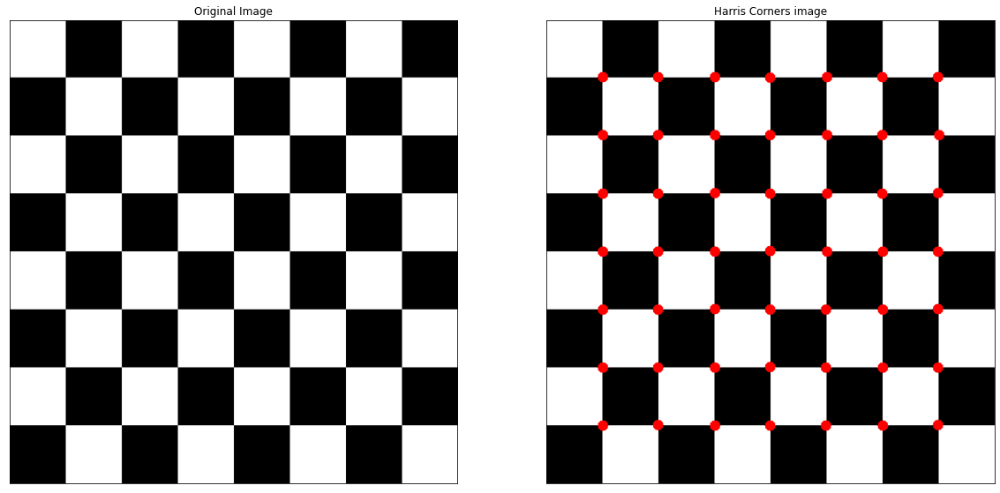

In [13]:
# Code taken from tutorial 3 with slight modificaitons
image = cv2.imread(path+'checkerboard.png') # BGR

# copy image
img_disp = image.copy()

# hyper-parameter k
k = 0.05
harris_img = Harris(image, k)


# normalize corner map [0,10]
# cv2.normalize(src, dst, alpha, beta, norm_type)
# min_I(dst(I)) = alpha, max_I(dst(I)) = beta
cv2.normalize(harris_img, harris_img, 0, 10, cv2.NORM_MINMAX)

# threshold for an optimal value
thres = 4

# list all points higher than threshold
loc = np.where(harris_img >= thres)

x,y = non_max_supress(loc[0],loc[1])

# code taken from tutorial 3
# loop though points
for pt in range(len(x)):
  # draw filled circle on each point
  # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
  cv2.circle(img_disp, (y[pt], x[pt]), 9, (255,0,0), -1)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(image, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp, cmap="gray")
plt.title("Harris Corners image"), plt.xticks([]), plt.yticks([])
plt.show()

For Cherckerboard image, setting the threshold value above 1 will result in less corner detected. For threshold values between 3 and 7, the number of detected corners is just right (49 corners). Furthermore, for threshold values between 0 and 3, the resulted corners detected are also correct. However, the run time of the algorithm is significantly higer... For threshold values greater than 7, not all corners are detected. Some corners are missing.

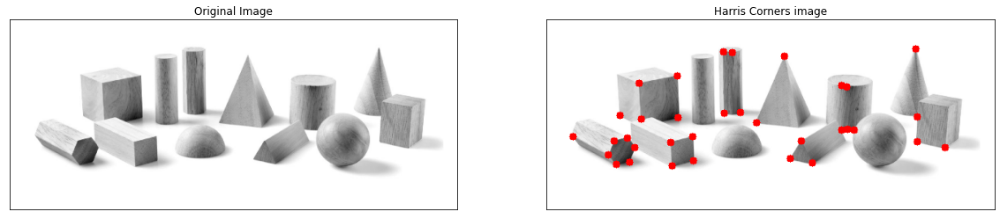

In [14]:
# Code taken from tutorial 3 with slight modificaitons
shape = cv2.imread(path+'shapes.png') # BGR

# copy image
img_disp = shape.copy()

# hyper-parameter k
k = 0.05
harris_img = Harris(shape, k)


# normalize corner map [0,10]
# cv2.normalize(src, dst, alpha, beta, norm_type)
# min_I(dst(I)) = alpha, max_I(dst(I)) = beta
cv2.normalize(harris_img, harris_img, 0, 10, cv2.NORM_MINMAX)

# threshold for an optimal value
thres = 6.1

# list all points higher than threshold
loc = np.where(harris_img >= thres)


x,y = non_max_supress(loc[0],loc[1])
# code taken from tutorial 3
# loop though points
for pt in range(len(x)):
  # draw filled circle on each point
  # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
  cv2.circle(img_disp, (y[pt], x[pt]), 5, (255,0,0), -1)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(shape, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp, cmap="gray")
plt.title("Harris Corners image"), plt.xticks([]), plt.yticks([])
plt.show()

For the shape image, threshold values lower than 6 takes a very long time to converge... A lot more corners are detected, sometimes not accurate. For threshold values greater than 6, the number of corners detected diminishes almost linearly. There are less and less corners detected but the resulting corners are very accurate. The good threshold was found to be 6.1-6.3 as the number of corners detected are about 20-28, and relatively accurate. For threshold values of 7 and above, less than 5 corners are detected... 

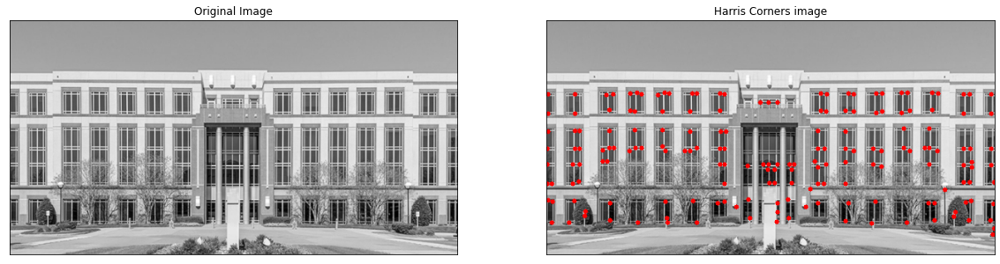

In [15]:
# Code taken from tutorial 3 with slight modificaitons
office = cv2.imread(path+'CLT_Office.jpg') # BGR

# copy image
img_disp = office.copy()

# hyper-parameter k
k = 0.05
harris_img = Harris(office, k)


# normalize corner map [0,10]
# cv2.normalize(src, dst, alpha, beta, norm_type)
# min_I(dst(I)) = alpha, max_I(dst(I)) = beta
cv2.normalize(harris_img, harris_img, 0, 10, cv2.NORM_MINMAX)

# threshold for an optimal value
thres = 4.5

# list all points higher than threshold
loc = np.where(harris_img >= thres)


x,y = non_max_supress(loc[0],loc[1])
# code taken from tutorial 3
# loop though points
for pt in range(len(x)):
  # draw filled circle on each point
  # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
  cv2.circle(img_disp, (y[pt], x[pt]), 3, (255,0,0), -1)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(office, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp, cmap="gray")
plt.title("Harris Corners image"), plt.xticks([]), plt.yticks([])
plt.show()

For the office image, for threshold values of below 3, the convergence time takes to long. Too many corners are detected and some are not very accurate. The sweet spot is between 4 and 6 as the number of corners varies between 108 and 267. For threshold values above 6, only less than 50 corners can be detected and the number diminishes as the threshold increases.

4. Image stitching

In [16]:
### need to install opencv-contrib-python

## run following command on your terminal
!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44

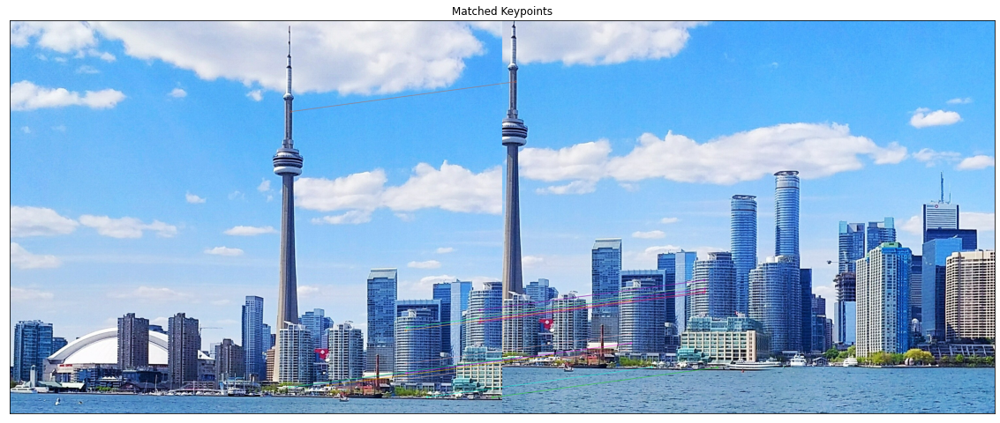

In [17]:
# code mostly taken from tutorial 4
import matplotlib.pyplot as plt
import cv2
import numpy as np

# read images and transform from BGR to RBG
toronto1 = cv2.imread(path+'1Toronto.jpg') # BGR
toronto1 = cv2.cvtColor(toronto1, cv2.COLOR_BGR2RGB)

toronto2 = cv2.imread(path+'2Toronto.jpg') # BGR
toronto2 = cv2.cvtColor(toronto2, cv2.COLOR_BGR2RGB)

# Code taken from Tutorial 4
# compute the SIFT keypoints and descriptors for each image
sift_obj = cv2.xfeatures2d.SIFT_create()
keypoints_1, descriptors_1 = sift_obj.detectAndCompute(toronto1, None)
keypoints_2, descriptors_2 = sift_obj.detectAndCompute(toronto2, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_1,descriptors_2) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints , find 20 best matches
imgmatch = cv2.drawMatches(toronto1 ,keypoints_1, toronto2, keypoints_2, matches[:20], None, flags=2)

# Display 20 best matched pairs in toronto 1 and 2
plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

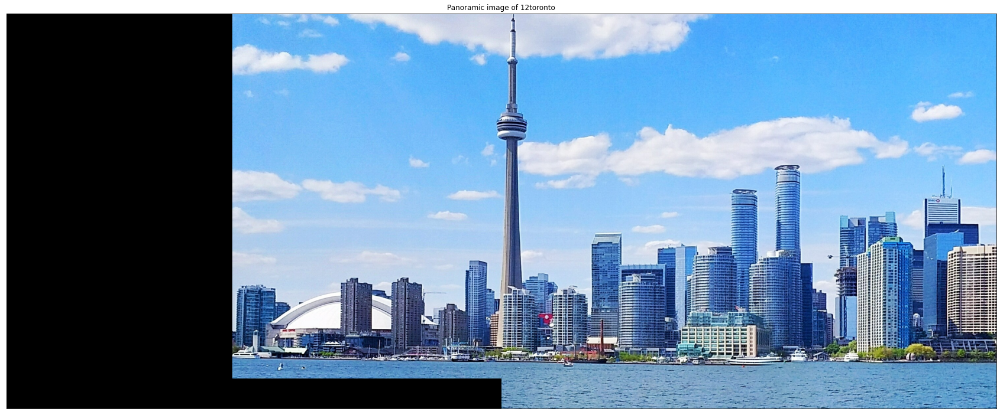

In [18]:
# code taken from tutorial 4
# Arrange matching keypoints in two separate lists
GoodMatches = []
# distance is hyper-param
for i, m in enumerate(matches):
    if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))


# toronto2 is train, toronto1 is query
mp2 = np.float32([keypoints_2[i].pt for (i, __) in GoodMatches])
mp1 = np.float32([keypoints_1[i].pt for (__, i) in GoodMatches])

# displace the points of matched points in mp2
# the coordinates need to be changed for homography
mp2[:,0] = mp2[:,0] + toronto2.shape[1]

# find homography and wrap image accordingly
# __ ignores values
# cv.FindHomography(srcPoints, dstPoints, H, method=0, ransacReprojThreshold=3.0, status=None)
H, __ = cv2.findHomography(mp1, mp2, cv2.RANSAC, 4)

# dst = cv2.warpPerspective(src, M, dsize, flags, boaderMode, boarderValue)
# shape[0] = rows = y, shape[1]= cols =x
toronto12 = cv2.warpPerspective(toronto1, H, (toronto2.shape[1]+toronto1.shape[1],toronto2.shape[0]))

# set right hand side to toronto 2
toronto12[:,toronto2.shape[1]:,:] = toronto2
plt.figure(figsize=(30,30))

plt.subplot(212)
plt.imshow(toronto12)
plt.title("Panoramic image of 12toronto"), plt.xticks([]), plt.yticks([])
plt.show()

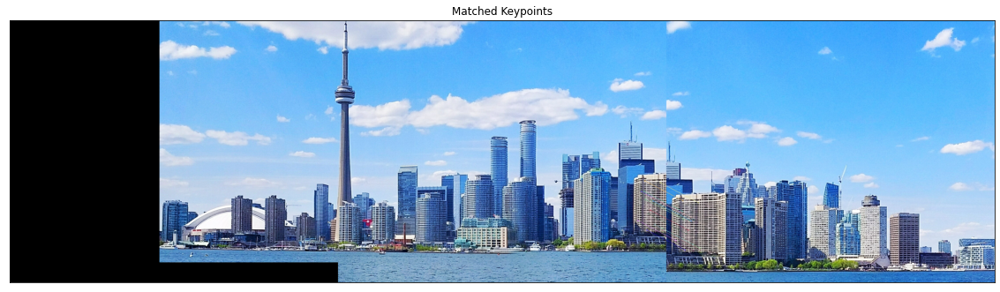

In [19]:
# part 2
toronto3 = cv2.imread(path+'3Toronto.jpg') # BGR
toronto3 = cv2.cvtColor(toronto3, cv2.COLOR_BGR2RGB)


# Code taken from Tutorial 4
# Compute keypoints and descriptors
# compute the SIFT keypoints and descriptors for each image
keypoints_12, descriptors_12 = sift_obj.detectAndCompute(toronto12, None)
keypoints_3, descriptors_3 = sift_obj.detectAndCompute(toronto3, None)

# create BFMatcher object
bf = cv2.BFMatcher()
# Match descriptors.
matches123 = bf.match(descriptors_12,descriptors_3) # train image, query image

# Sort them in the order of their distance.
matches123 = sorted(matches123, key = lambda x:x.distance)

# Draw keypoints , find 20 best matches
imgmatch123 = cv2.drawMatches(toronto12 ,keypoints_12, toronto3, keypoints_3, matches123[:20], None, flags=2)


# Display 20 best matched pairs in toronto 1 and 2
plt.figure(figsize=(20,20))
plt.subplot(111)
plt.imshow(imgmatch123)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

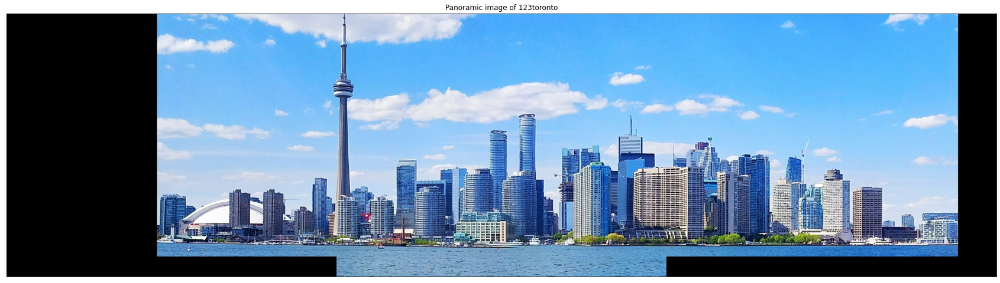

In [20]:
# code taken from tutorial 4
# Arrange matching keypoints in two separate lists
GoodMatches = []
# distance is hyper-param
for i, m in enumerate(matches123):
    if m.distance < 400:
        GoodMatches.append((m.trainIdx, m.queryIdx))


# toronto2 is train, toronto1 is query
mp12 = np.float32([keypoints_12[i].pt for (__, i) in GoodMatches])
mp3 = np.float32([keypoints_3[i].pt for (i, __) in GoodMatches])


# find homography and wrap image accordingly
# __ ignores values
# cv.FindHomography(srcPoints, dstPoints, H, method=0, ransacReprojThreshold=3.0, status=None)
H, __ = cv2.findHomography(mp3, mp12, cv2.RANSAC, 4)

# dst = cv2.warpPerspective(src, M, dsize, flags, boaderMode, boarderValue)
# shape[0] = rows = y, shape[1]= cols =x
toronto123 = cv2.warpPerspective(toronto3, H, (toronto12.shape[1]+toronto3.shape[1],toronto3.shape[0]))

toronto123[:,:toronto12.shape[1],:] = toronto12
plt.figure(figsize=(30,30))

plt.subplot(212)
plt.imshow(toronto123)
plt.title("Panoramic image of 123toronto"), plt.xticks([]), plt.yticks([])
plt.show()